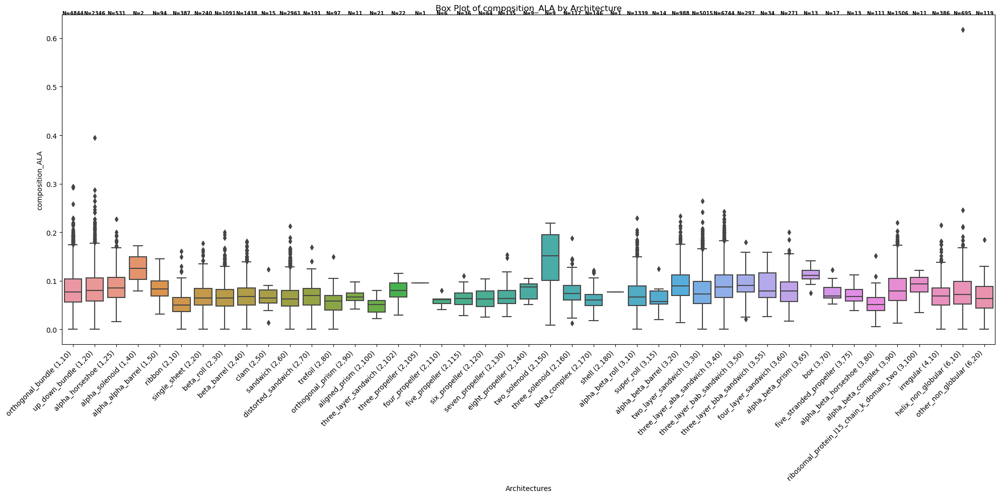

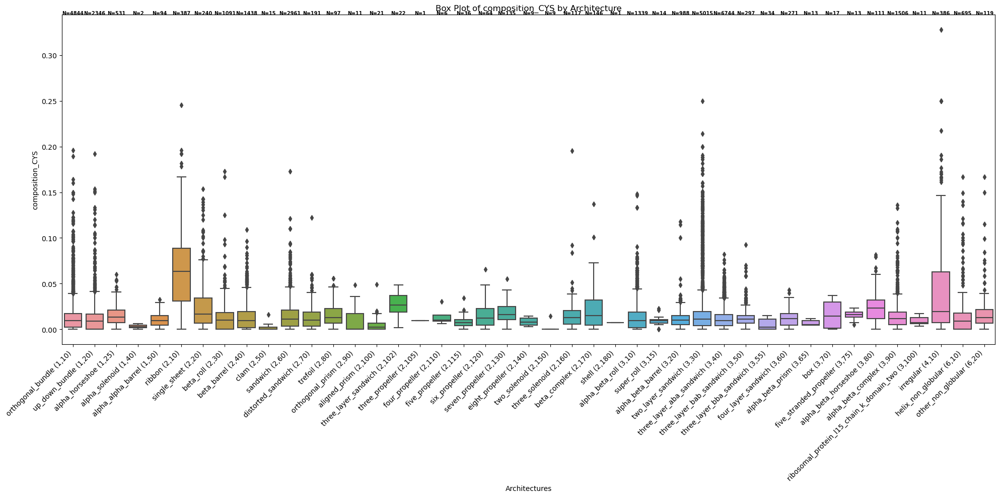

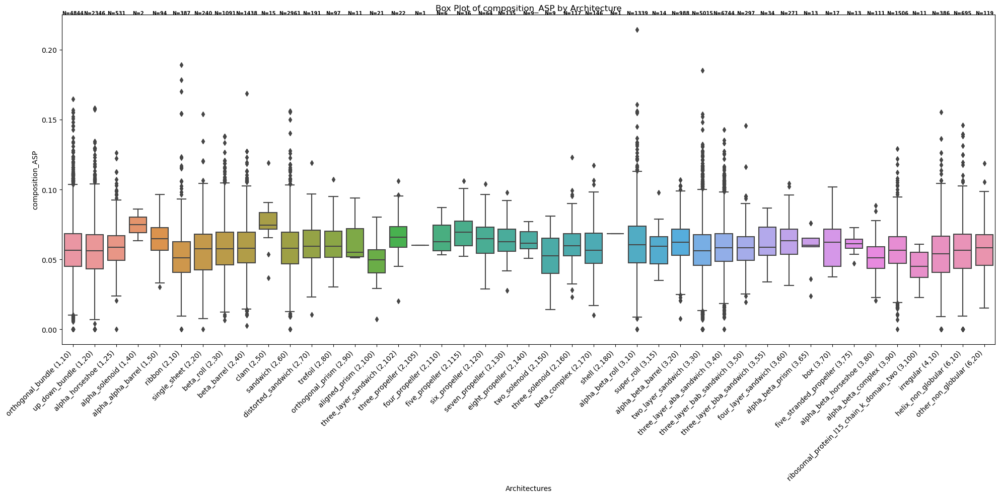

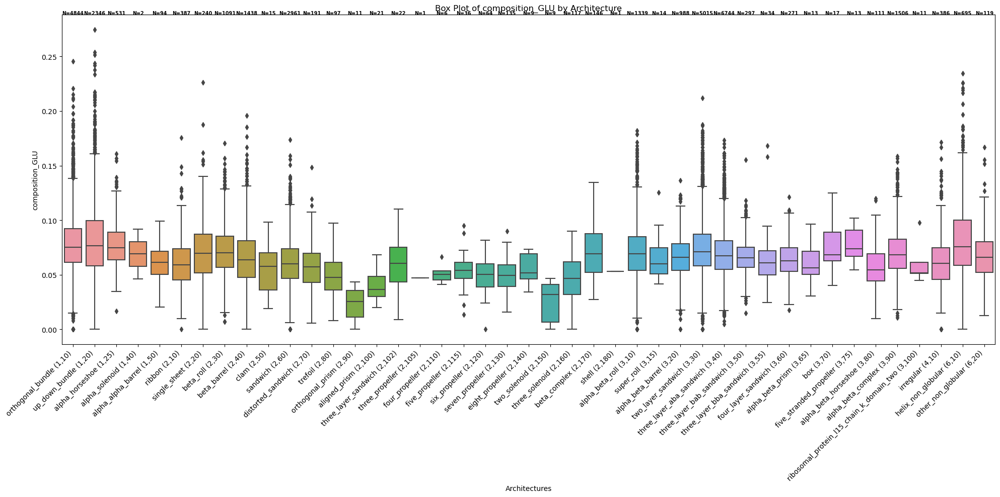

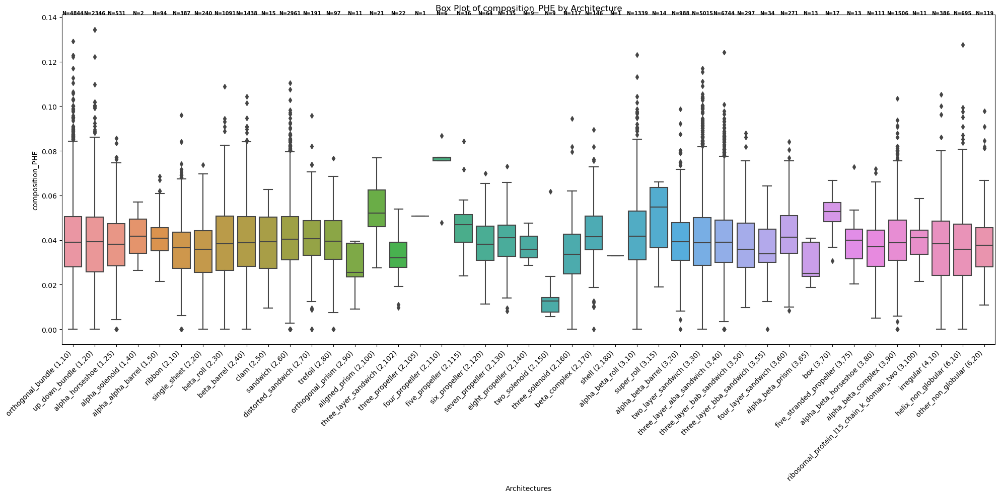

...

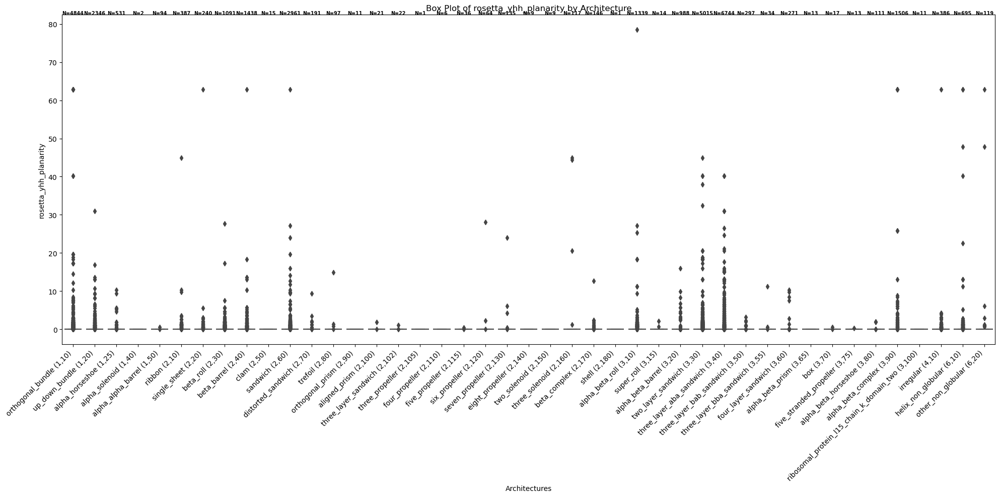

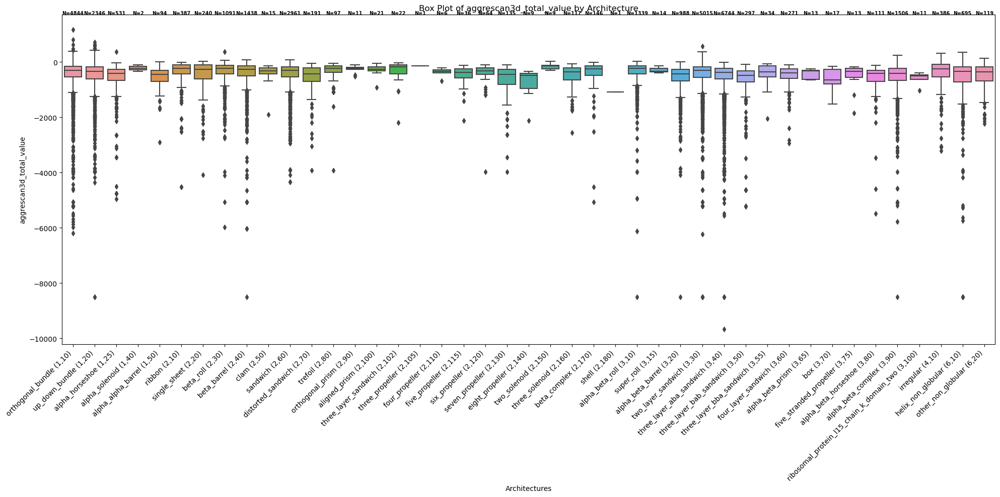

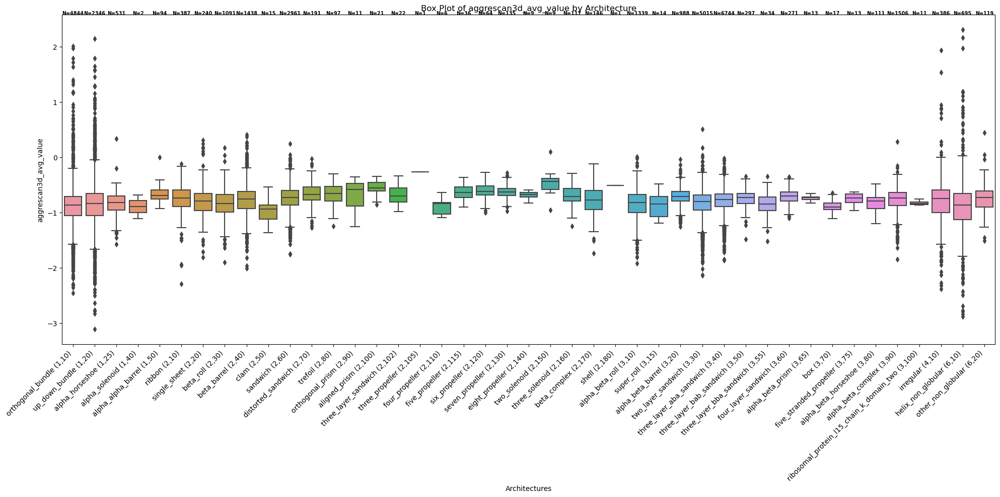

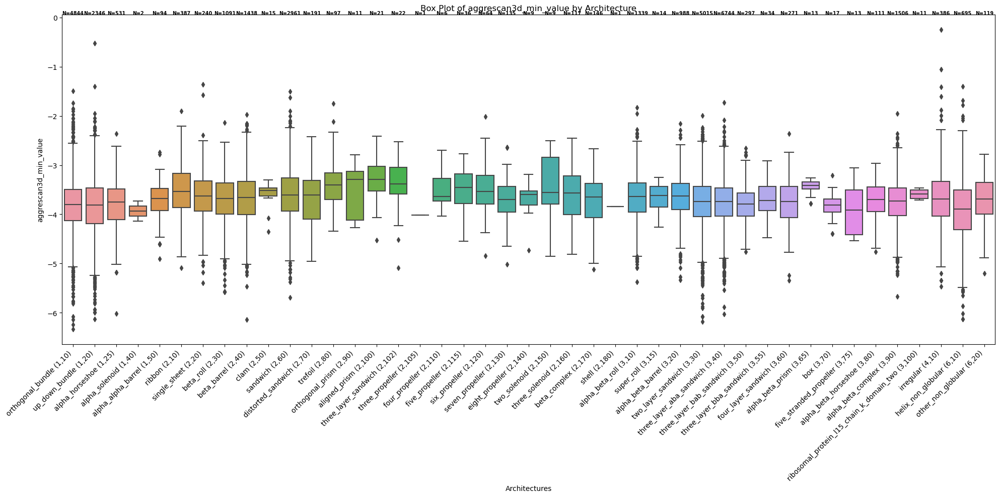

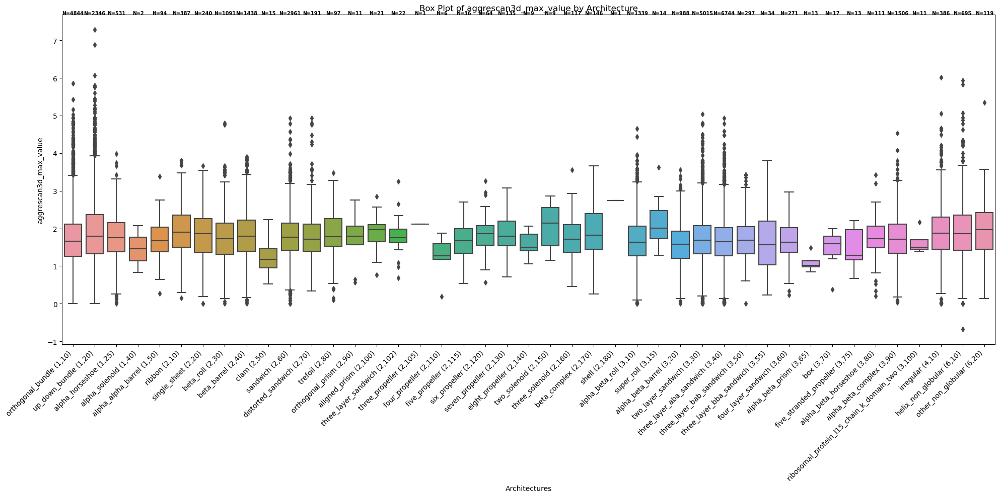

In [1]:
# DESTRESS data visualisation by box plot

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import pandas as pd
import csv
import os

# ---------------------------------------------------------------------------------------------------
# data import

destress_data_path = '/volumes/dax-hd/project-data/search-files/destress-data.csv'
cath_data_path = '/volumes/dax-hd/project-data/search-files/cath-domain-list-S35.csv'
image_dir = '/Users/daxtraill/Honours Project/figures/destress_box_plots'

# ---------------------------------------------------------------------------------------------------
# Data-frame manipulation

df_main = pd.read_csv(destress_data_path)
df_cath = pd.read_csv(cath_data_path)

df_cath['CATH domain name'] = df_cath['CATH domain name'].str[:4]
df_cath.rename(columns={'CATH domain name': 'design_name'}, inplace=True)

df_merged = pd.merge(df_cath, df_main, on='design_name', how='left')

df_merged['Class number']
df_merged['Architecture number']


# ---------------------------------------------------------------------------------------------------
# variable data

cath_ids = {
    1: {
        10: 'orthogonal_bundle', 20: 'up_down_bundle', 25: 'alpha_horseshoe', 40: 'alpha_solenoid', 50: 'alpha_alpha_barrel'
    },
    2: {
        10: 'ribbon', 20: 'single_sheet', 30: 'beta_roll', 40: 'beta_barrel', 50: 'clam', 60: 'sandwich', 70: 'distorted_sandwich',
        80: 'trefoil', 90: 'orthogonal_prism', 100: 'aligned_prism', 102: 'three_layer_sandwich', 105: 'three_propeller',
        110: 'four_propeller', 115: 'five_propeller', 120: 'six_propeller', 130: 'seven_propeller', 140: 'eight_propeller',
        150: 'two_solenoid', 160: 'three_solenoid', 170: 'beta_complex', 180: 'shell'
    },
    3: {
        10: 'alpha_beta_roll', 15: 'super_roll', 20: 'alpha_beta_barrel', 30: 'two_layer_sandwich', 40: 'three_layer_aba_sandwich',
        50: 'three_layer_bab_sandwich', 55: 'three_layer_bba_sandwich', 60: 'four_layer_sandwich', 65: 'alpha_beta_prism', 70: 'box',
        75: 'five_stranded_propeller', 80: 'alpha_beta_horseshoe', 90: 'alpha_beta_complex', 100: 'ribosomal_protein_l15_chain_k_domain_two'
    },
    4: {
        10: 'irregular'
    },
    6: {
        10: 'helix_non_globular', 20: 'other_non_globular'
    }
}

destress_columns = [
    "composition_ALA", "composition_CYS", "composition_ASP", "composition_GLU", "composition_PHE",
    "composition_GLY", "composition_HIS", "composition_ILE", "composition_LYS",
    "composition_LEU", "composition_MET", "composition_ASN", "composition_PRO",
    "composition_GLN", "composition_ARG", "composition_SER", "composition_THR",
    "composition_VAL", "composition_TRP", "composition_UNK", "composition_TYR",
    "ss_prop_alpha_helix", "ss_prop_beta_bridge", "ss_prop_beta_strand", "ss_prop_3_10_helix",
    "ss_prop_pi_helix", "ss_prop_hbonded_turn", "ss_prop_bend", "ss_prop_loop",
    "hydrophobic_fitness", "isoelectric_point", "charge", "mass", "num_residues",
    "packing_density", "budeff_total", "budeff_steric", "budeff_desolvation",
    "budeff_charge", "evoef2_total", "evoef2_ref_total", "evoef2_intraR_total",
    "evoef2_interS_total", "evoef2_interD_total", "dfire2_total", "rosetta_total",
    "rosetta_fa_atr", "rosetta_fa_rep", "rosetta_fa_intra_rep", "rosetta_fa_elec",
    "rosetta_fa_sol", "rosetta_lk_ball_wtd", "rosetta_fa_intra_sol_xover4", "rosetta_hbond_lr_bb",
    "rosetta_hbond_sr_bb", "rosetta_hbond_bb_sc", "rosetta_hbond_sc", "rosetta_dslf_fa13",
    "rosetta_rama_prepro", "rosetta_p_aa_pp", "rosetta_fa_dun", "rosetta_omega",
    "rosetta_pro_close", "rosetta_yhh_planarity", "aggrescan3d_total_value", "aggrescan3d_avg_value",
    "aggrescan3d_min_value", "aggrescan3d_max_value"
]

# ---------------------------------------------------------------------------------------------------
# Add the architecture name to df

def add_architecture_name(df):

    def get_arch_name(row):
        class_num = row['Class number']
        arch_num = row['Architecture number']
        try:
            name = f"{cath_ids[class_num][arch_num]} ({class_num},{arch_num})"
            return name
        except KeyError:
            return "Unknown"
    
    df['architecture_name'] = df.apply(get_arch_name, axis=1)
    
    return df

df_merged = add_architecture_name(df_merged)

cols = df_merged.columns.tolist()
cols.insert(1, cols.pop(cols.index('architecture_name')))
df_merged = df_merged[cols]

# ---------------------------------------------------------------------------------------------------

architecture_counts = df_merged['architecture_name'].value_counts()


os.makedirs(image_dir, exist_ok=True)

for variable in destress_columns:
    plt.figure(figsize=(20, 10))
    ax = sns.boxplot(data=df_merged, x='architecture_name', y=variable)
    plt.xticks(rotation=45, ha="right")
    plt.title(f'Box Plot of {variable} by Architecture')
    plt.xlabel('Architectures')
    plt.ylabel(variable)

    architecture_counts = df_merged['architecture_name'].value_counts()

    x_ticks = ax.get_xticks()

    for tick in x_ticks:
        architecture_name = ax.get_xticklabels()[tick].get_text()
        count = architecture_counts.get(architecture_name, 0)
        ax.text(tick, plt.ylim()[1], f'N={count}', horizontalalignment='center', size='x-small', color='black', weight='semibold')

    plt.tight_layout()
    plt.show()

In [15]:
# Save CSV
output_csv_path = '/volumes/dax-hd/project-data/search-files/merged_data.csv'

df_merged.to_csv(output_csv_path, index=False)
